In [7]:
import requests
from PIL import Image
import json

In [8]:
SUBSCRIPTIONKEY='f37650dbe4bd4d35966e156fc524ab84'

In [9]:
assert SUBSCRIPTIONKEY

In [10]:
face_api_url ='https://20201201motiduki.cognitiveservices.azure.com/face/v1.0/detect'


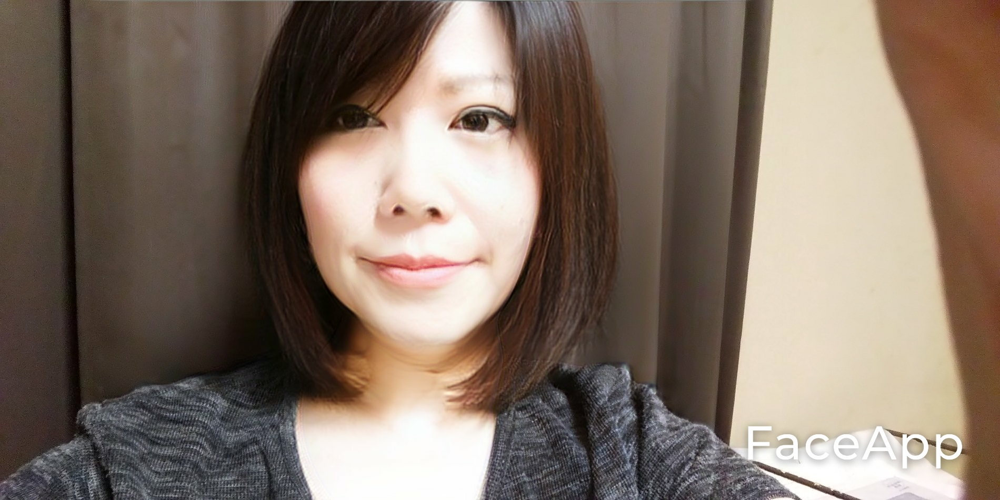

In [11]:
img=Image.open('sample.jpg')
img

In [12]:
with open('sample.jpg','rb')as f:
    binary_img=f.read()

In [13]:
#binary_img

In [14]:
headers = {'Ocp-Apim-Subscription-Key':  SUBSCRIPTIONKEY,
            'Content-Type':'application/octet-stream'}
params = {
    'returnFaceAttributes': 'age,gender,headPose,smile,facialHair,glasses,emotion,hair,makeup,occlusion,accessories,blur,exposure,noise',
    'returnFaceId': 'true'
}

res = requests.post(face_api_url, params=params,
                         headers=headers,data=binary_img )

In [15]:
res

<Response [200]>

In [16]:

result=res.json()
result[0]

{'faceId': '70449b19-8f17-4c5b-b773-dd5485a7c600',
 'faceRectangle': {'top': 74, 'left': 509, 'width': 565, 'height': 565},
 'faceAttributes': {'smile': 0.432,
  'headPose': {'pitch': -4.2, 'roll': 3.7, 'yaw': -2.6},
  'gender': 'female',
  'age': 26.0,
  'facialHair': {'moustache': 0.0, 'beard': 0.0, 'sideburns': 0.0},
  'glasses': 'NoGlasses',
  'emotion': {'anger': 0.0,
   'contempt': 0.004,
   'disgust': 0.0,
   'fear': 0.0,
   'happiness': 0.432,
   'neutral': 0.563,
   'sadness': 0.0,
   'surprise': 0.0},
  'blur': {'blurLevel': 'low', 'value': 0.02},
  'exposure': {'exposureLevel': 'goodExposure', 'value': 0.66},
  'noise': {'noiseLevel': 'low', 'value': 0.0},
  'makeup': {'eyeMakeup': True, 'lipMakeup': True},
  'accessories': [],
  'occlusion': {'foreheadOccluded': False,
   'eyeOccluded': False,
   'mouthOccluded': False},
  'hair': {'bald': 0.04,
   'invisible': False,
   'hairColor': [{'color': 'brown', 'confidence': 1.0},
    {'color': 'black', 'confidence': 0.96},
    {'c

In [17]:
smile=result[ 'faceAttributes']['smile']
print('smile:'+str(smile))


TypeError: list indices must be integers or slices, not str

In [ ]:
gender=result[0][ 'faceAttributes']['gender']
gender

In [ ]:
age=result[0][ 'faceAttributes']['age']
age

In [ ]:
rect=result[0]['faceRectangle']
rect

In [18]:
from PIL import ImageDraw

In [19]:
draw=ImageDraw.Draw(img)


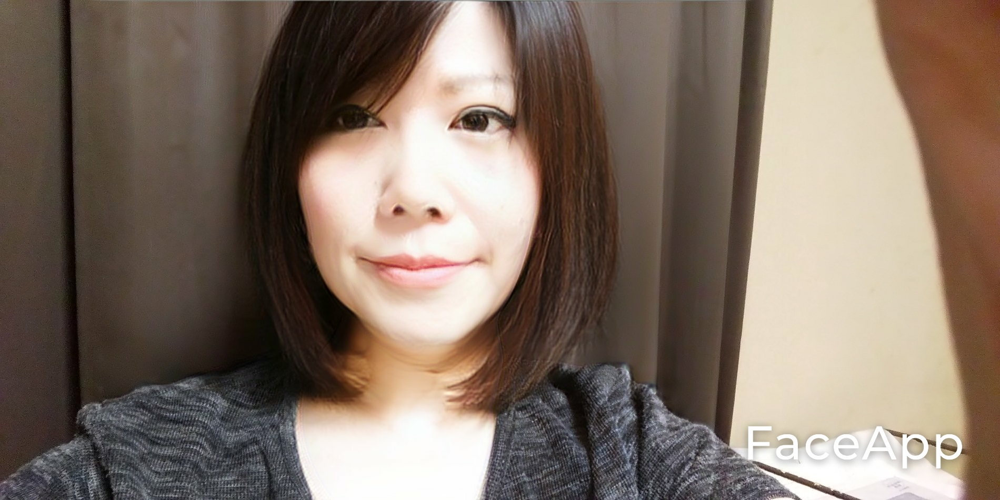

In [20]:
img

In [21]:
rect

NameError: name 'rect' is not defined

In [22]:
draw.rectangle([(rect['left'],rect['top']),(rect['left']+rect['width'],rect['top']+rect['height'])],fill=None,outline='green',width=5)
img

NameError: name 'rect' is not defined

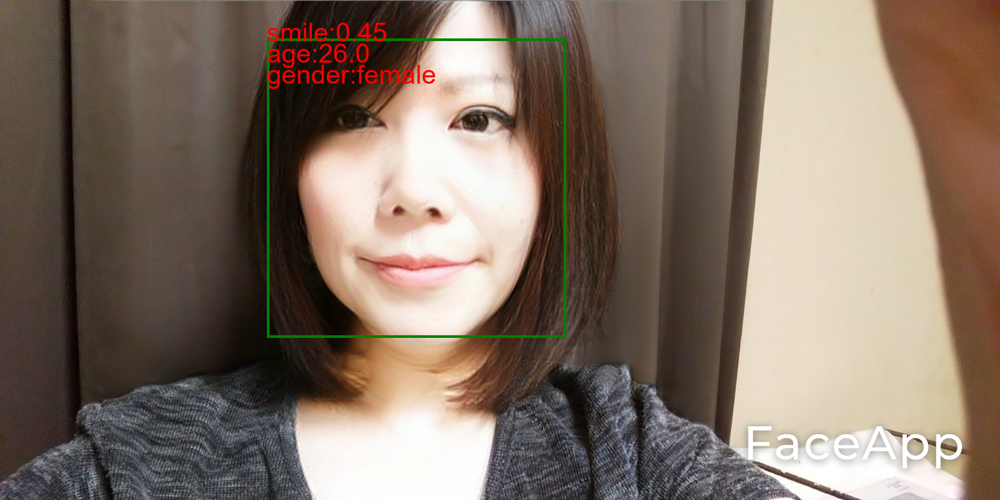

In [40]:
import requests
from PIL import Image
from PIL import ImageDraw, ImageFont
import cv2
import io

SUBSCRIPTIONKEY='f37650dbe4bd4d35966e156fc524ab84'
assert SUBSCRIPTIONKEY
face_api_url ='https://20201201motiduki.cognitiveservices.azure.com/face/v1.0/detect'

img=Image.open('sample.jpg')

with io.BytesIO() as output:
    img.save(output,format="JPEG")
    binary_img=output.getvalue()
headers = {'Ocp-Apim-Subscription-Key':  SUBSCRIPTIONKEY,
            'Content-Type':'application/octet-stream'}
params = {
    'returnFaceAttributes': 'age,gender,headPose,smile,facialHair,glasses,emotion,hair,makeup,occlusion,accessories,blur,exposure,noise',
    'returnFaceId': 'true'
}

res = requests.post(face_api_url, params=params,
                         headers=headers,data=binary_img )
results=res.json()

for result in results:
    rect=result['faceRectangle']
    age=result[ 'faceAttributes']['age']
    gender=result[ 'faceAttributes']['gender']
    smile=result[ 'faceAttributes']['smile']
    age='age:'+str(age)
    gender='gender:'+str(gender)
    smile='smile:'+str(smile)
    draw=ImageDraw.Draw(img)
    draw.rectangle([(rect['left'],rect['top']),(rect['left']+rect['width'],rect['top']+rect['height'])],fill=None,outline='green',width=5)
    font = ImageFont.truetype("arial.ttf", 50)
    draw.text((rect['left'],rect['top']),age, 250,font=font)
    draw.text((rect['left'],rect['top']+40), gender, 250,font=font)
    draw.text((rect['left'],rect['top']-40), smile, 250,font=font)
    
img

In [24]:
import io

In [34]:
with io.BytesIO() as  output:
    img.save(output,format="JPEG")
    binary_img=output.getvalue()

In [35]:
io.BytesIO()

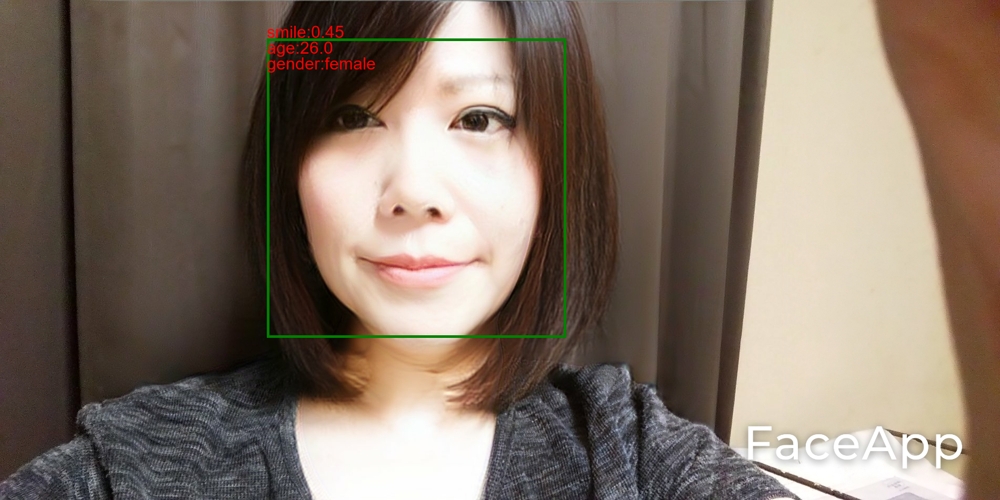

In [36]:
img